# NUOPC vs MCT B-compsets

**NUOPC case**: bmom.e23.f09_t061_zstar_N65.nuopc.nuopc_validation.003

**MCT case**: bmom.e23.f09_t061_zstar_N65.mct.nuopc_validation.003

Both are out-of-the-box cases, run for 20 years.

Gustavo Marques (gmarques@ucar.edu)


In [1]:
from datetime import date
print("Last update:", date.today())

Last update: 2021-09-03


In [2]:
from IPython.display import Image, HTML, display
import xarray as xr
import numpy as np
import matplotlib.pyplot as plt
import seaborn, matplotlib
import warnings, os
from mom6_tools.MOM6grid import MOM6grid
from mom6_tools.m6toolbox import genBasinMasks
from mom6_tools.m6plot import ztplot, xyplot, yzplot, chooseColorLevels
import pop_tools
warnings.filterwarnings("ignore")
matplotlib.rcParams.update({'font.size': 14})
%matplotlib inline

Basemap module not found. Some regional plots may not function properly


Cannot write to data cache '/glade/p/cesmdata/cseg'. Will not be able to download remote data files. Use environment variable 'CESMDATAROOT' to specify another directory.


In [3]:
path = '/glade/scratch/gmarques/'
exps = ['bmom.e23.f09_t061_zstar_N65.nuopc.nuopc_validation.003', \
        'bmom.e23.f09_t061_zstar_N65.nuopc.nuopc_validation.004', \
        'bmom.e23.f09_t061_zstar_N65.nuopc.nuopc_validation.006', \
        'bmom.e23.f09_t061_zstar_N65.mct.nuopc_validation.003', \
        'bmom.e23.f09_t061_zstar_N65.mct.nuopc_validation.004']

labels = ['NUOPC1', 'NUOPC2', 'NUOPC3', 'MCT1', 'MCT2']

# set this to true to save the plots
saveplot = False
if saveplot:
    os.system('mkdir PNG')

In [4]:
def get_data(full_path, variables):
  def preprocess(ds):
    ''' Return the dataset with variable'''
    return ds[variables]
  ds = xr.open_mfdataset(full_path, data_vars='minimal', \
                         coords='minimal', compat='override', preprocess=preprocess)
  return ds

In [5]:
# load grid and pre-difined masks
grd = MOM6grid(path+exps[0]+'/run/'+exps[0]+'.mom6.static.nc')
grd_xr = MOM6grid(path+exps[0]+'/run/'+exps[0]+'.mom6.static.nc', xrformat=True)
depth = grd.depth_ocean
# remote Nan's, otherwise genBasinMasks won't work
depth[np.isnan(depth)] = 0.0
basin_code = genBasinMasks(grd.geolon, grd.geolat, depth, xda=True)
area = np.ma.masked_where(grd.wet==0,grd.area_t)

MOM6 grid successfully loaded... 

MOM6 grid successfully loaded... 

11.16427964664149 64.78854837178643 [391, 434]


In [6]:
# bmom.e23.f09_t061_zstar_N65.nuopc.nuopc_validation.005

n = 1 # year
hi = 1.9799490287319331E+25
hf = 1.9816389321655156E+25 
cpl = -1.67757434
heat = (hf-hi) / (area.sum() * 3600. * 24 * 365 * n)
print('Change in heat from MOM log is {} W/m2'.format(heat))
print('Change in heat from cpl log is {} W/m2'.format(cpl))
print(cpl+heat)

Change in heat from MOM log is 1.489419744767096 W/m2
Change in heat from cpl log is -1.67757434 W/m2
-0.188154595232904


In [7]:
# bmom.e23.f09_t061_zstar_N65.mct.nuopc_validation.005
n = 1 # year
hi = 1.9799490287319331E+25
hf = 1.9826105645709241E+25 
cpl = -1.06436100
heat = (hf-hi) / (area.sum() * 3600. * 24 * 365 * n)
print('Change in heat from MOM log is {} W/m2'.format(heat))
print('Change in heat from cpl log is {} W/m2'.format(cpl))
print(cpl+heat)

Change in heat from MOM log is 2.345781392724059 W/m2
Change in heat from cpl log is -1.064361 W/m2
1.2814203927240593


## Chage in ocean heat over 20 years

In [8]:
n = 20 # years

### mct.nuopc_validation.003

In [9]:
# bmom.e23.f09_t061_zstar_N65.mct.nuopc_validation.003
hi = 1.9799490287319331E+25
hf = 1.9889238581497101E+25
cpl = 0.45286483
heat = (hf-hi) / (area.sum() * 3600. * 24 * 365. * n)
print('Change in heat from MOM log is {} W/m2'.format(heat))
print('Change in heat from cpl log is {} W/m2'.format(cpl))
print(cpl-heat)

Change in heat from MOM log is 0.3955044967396644 W/m2
Change in heat from cpl log is 0.45286483 W/m2
0.05736033326033557


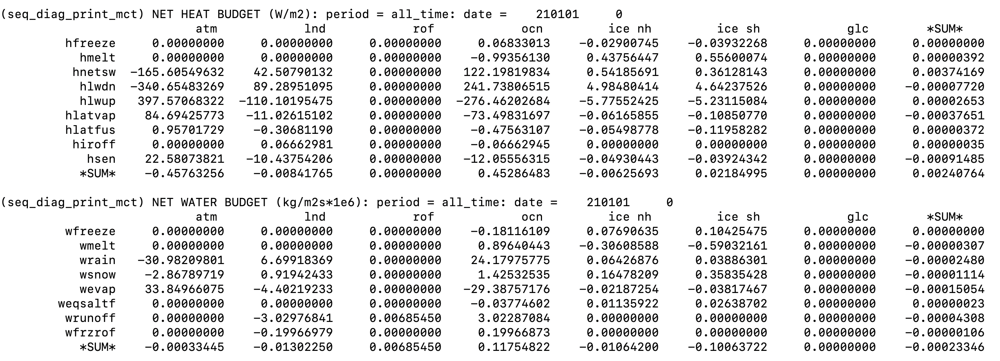

In [10]:
exp = 'bmom.e23.f09_t061_zstar_N65.mct.nuopc_validation.003'
mct_frc = xr.open_mfdataset(path+exp+'/run/'+exp+'.mom6.frc_????.nc').mean(dim='time')

In [11]:
mct_frc

<xarray.Dataset>
Dimensions:                                (xq: 540, yh: 458, nv: 2, xh: 540, yq: 458, scalar_axis: 1)
Coordinates:
  * xq                                     (xq) float64 -286.3 -285.7 ... 73.0
  * yh                                     (yh) float64 -79.2 -79.08 ... 87.74
  * nv                                     (nv) float64 1.0 2.0
  * xh                                     (xh) float64 -286.7 -286.0 ... 72.67
  * yq                                     (yq) float64 -79.14 -79.01 ... 87.74
  * scalar_axis                            (scalar_axis) float64 0.0
Data variables: (12/44)
    taux                                   (yh, xq) float64 dask.array<chunksize=(458, 540), meta=np.ndarray>
    tauy                                   (yq, xh) float64 dask.array<chunksize=(458, 540), meta=np.ndarray>
    ustar                                  (yh, xh) float64 dask.array<chunksize=(458, 540), meta=np.ndarray>
    PRCmE                                  (yh, xh) float64 dask.array<chunksize=(458, 540), meta=np.ndarray>
    lprec                                  (yh, xh) float64 dask.array<chunksize=(458, 540), meta=np.ndarray>
    fprec                                  (yh, xh) float64 dask.array<chunksize=(458, 540), meta=np.ndarray>
    ...                                     ...
    net_fresh_water_global_adjustment      (scalar_axis) float64 dask.array<chunksize=(1,), meta=np.ndarray>
    salt_flux_global_restoring_adjustment  (scalar_axis) float64 dask.array<chunksize=(1,), meta=np.ndarray>
    net_massout                            (yh, xh) float64 dask.array<chunksize=(458, 540), meta=np.ndarray>
    net_massin                             (yh, xh) float64 dask.array<chunksize=(458, 540), meta=np.ndarray>
    average_DT                             timedelta64[ns] dask.array<chunksize=(), meta=np.ndarray>
    time_bnds                              (nv) timedelta64[ns] dask.array<chunksize=(2,), meta=np.ndarray>

In [12]:
Heat_PmE = np.ma.masked_invalid(mct_frc.Heat_PmE.values)
net_heat_surface = np.ma.masked_invalid(mct_frc.net_heat_surface.values)
net_heat_coupler = np.ma.masked_invalid(mct_frc.net_heat_coupler.values)
heat_content_surfwater = np.ma.masked_invalid(mct_frc.heat_content_surfwater.values)
heat_content_icemelt = np.ma.masked_invalid(mct_frc.heat_content_icemelt)

In [13]:
frazil = np.ma.masked_invalid(mct_frc.frazil.values)
net_heat_coupler = net_heat_coupler - frazil

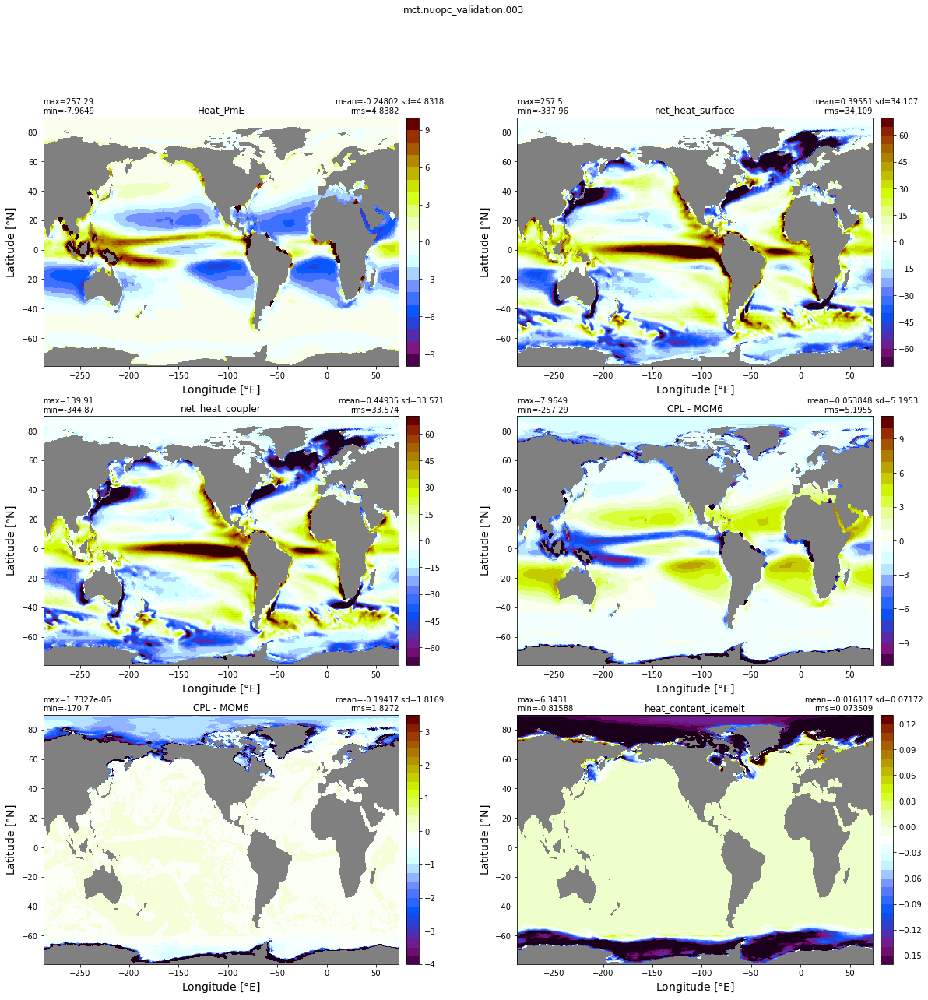

In [14]:
fig, ax = plt.subplots(nrows=3, ncols=2, figsize=(20,20))
ax1 = ax.flatten()
plt.suptitle('mct.nuopc_validation.003')
diff = np.ma.masked_invalid(net_heat_coupler - net_heat_surface)
xyplot(Heat_PmE,grd.geolon, grd.geolat, grd.area_t, axis=ax1[0], title='Heat_PmE')
xyplot(net_heat_surface,grd.geolon, grd.geolat, grd.area_t, axis=ax1[1], title='net_heat_surface')
xyplot(net_heat_coupler,grd.geolon, grd.geolat, grd.area_t, axis=ax1[2], title='net_heat_coupler')
xyplot(diff,grd.geolon, grd.geolat, grd.area_t, axis=ax1[3], title='CPL - MOM6')
xyplot(Heat_PmE+diff,grd.geolon, grd.geolat, grd.area_t, axis=ax1[4], title='CPL - MOM6')
xyplot(heat_content_icemelt,grd.geolon, grd.geolat, grd.area_t, axis=ax1[5], title='heat_content_icemelt')

### mct.nuopc_validation.004

In [15]:
# bmom.e23.f09_t061_zstar_N65.mct.nuopc_validation.004
hi = 1.9799518024764015E+25
hf = 1.9904782497634589E+25 
cpl = 0.50001278
heat = (hf-hi) / (area.sum() * 3600. * 24 * 365. * n)
print('Change in heat from MOM log is {} W/m2'.format(heat))
print('Change in heat from cpl log is {} W/m2'.format(cpl))
print(cpl-heat)

Change in heat from MOM log is 0.46388148932143713 W/m2
Change in heat from cpl log is 0.50001278 W/m2
0.03613129067856291


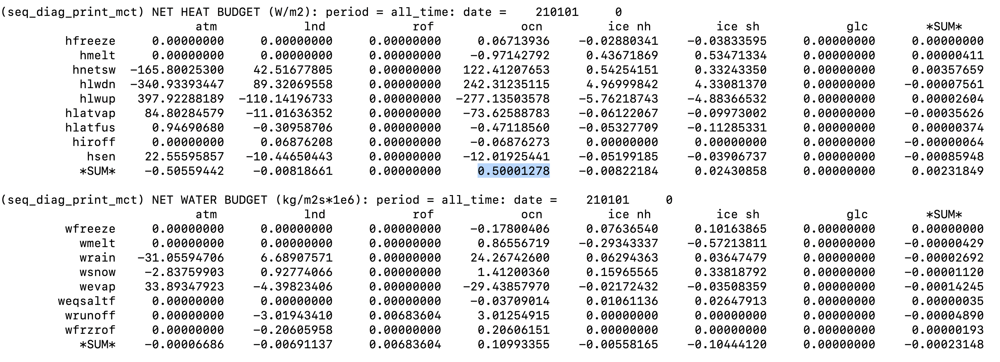

In [ ]:
exp = 'bmom.e23.f09_t061_zstar_N65.mct.nuopc_validation.004'
mct_frc = xr.open_mfdataset(path+exp+'/run/'+exp+'.mom6.frc_????.nc').mean(dim='time')

In [ ]:
Heat_PmE = np.ma.masked_invalid(mct_frc.Heat_PmE.values)
net_heat_surface = np.ma.masked_invalid(mct_frc.net_heat_surface.values)
net_heat_coupler = np.ma.masked_invalid(mct_frc.net_heat_coupler.values)
heat_content_surfwater = np.ma.masked_invalid(mct_frc.heat_content_surfwater.values)

In [ ]:
fig, ax = plt.subplots(nrows=2, ncols=2, figsize=(20,12))
ax1 = ax.flatten()
plt.suptitle('mct.nuopc_validation.004')

xyplot(Heat_PmE,grd.geolon, grd.geolat, grd.area_t, axis=ax1[0], title='Heat_PmE')
xyplot(net_heat_surface,grd.geolon, grd.geolat, grd.area_t, axis=ax1[1], title='net_heat_surface')
xyplot(net_heat_coupler,grd.geolon, grd.geolat, grd.area_t, axis=ax1[2], title='net_heat_coupler')
xyplot(net_heat_coupler - net_heat_surface,grd.geolon, grd.geolat, grd.area_t, axis=ax1[3], title='CPL - MOM6')

### nuopc.nuopc_validation.003

In [ ]:
# bmom.e23.f09_t061_zstar_N65.nuopc.nuopc_validation.003
hi = 1.9799490287319331E+25
hf = 1.9860195808674892E+25 
cpl = 0.73313304
heat = (hf-hi) / (area.sum() * 3600. * 24 * 365. * n)
print('Change in heat from MOM log is {} W/m2'.format(heat))
print('Change in heat from cpl log is {} W/m2'.format(cpl))
print(cpl-heat)

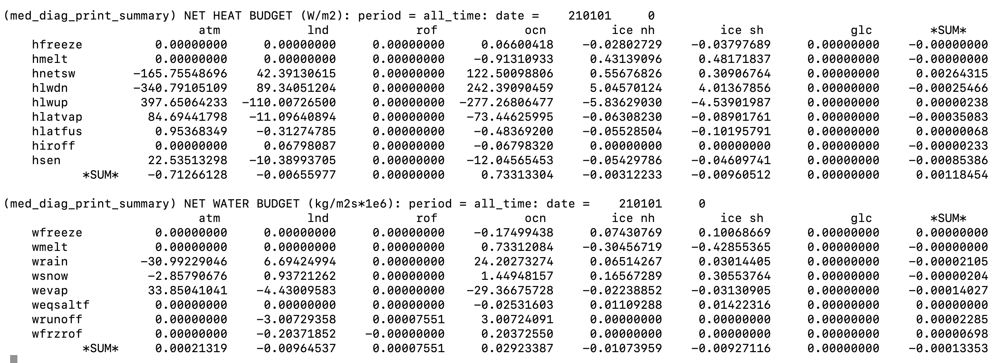

In [ ]:
exp = 'bmom.e23.f09_t061_zstar_N65.nuopc.nuopc_validation.003'
nuopc_frc = xr.open_mfdataset(path+exp+'/run/'+exp+'.mom6.frc_????.nc').mean(dim='time')

In [ ]:
Heat_PmE = np.ma.masked_invalid(nuopc_frc.Heat_PmE.values)
net_heat_surface = np.ma.masked_invalid(nuopc_frc.net_heat_surface.values)
net_heat_coupler = np.ma.masked_invalid(nuopc_frc.net_heat_coupler.values)
heat_content_surfwater = np.ma.masked_invalid(nuopc_frc.heat_content_surfwater.values)

In [ ]:
fig, ax = plt.subplots(nrows=2, ncols=2, figsize=(20,12))
ax1 = ax.flatten()
plt.suptitle('nuopc.nuopc_validation.003')

xyplot(Heat_PmE,grd.geolon, grd.geolat, grd.area_t, axis=ax1[0], title='Heat_PmE')
xyplot(net_heat_surface,grd.geolon, grd.geolat, grd.area_t, axis=ax1[1], title='net_heat_surface')
xyplot(net_heat_coupler,grd.geolon, grd.geolat, grd.area_t, axis=ax1[2], title='net_heat_coupler')
xyplot(net_heat_coupler - net_heat_surface,grd.geolon, grd.geolat, grd.area_t, axis=ax1[3], title='CPL - MOM6')

### nuopc.nuopc_validation.004

In [ ]:
# bmom.e23.f09_t061_zstar_N65.nuopc.nuopc_validation.004
hi = 1.9799518024764015E+25
hf = 1.9854068822328732E+25  
cpl = 0.61765629
heat = (hf-hi) / (area.sum() * 3600. * 24 * 365. * n)
print('Change in heat from MOM log is {} W/m2'.format(heat))
print('Change in heat from cpl log is {} W/m2'.format(cpl))
print(cpl-heat)

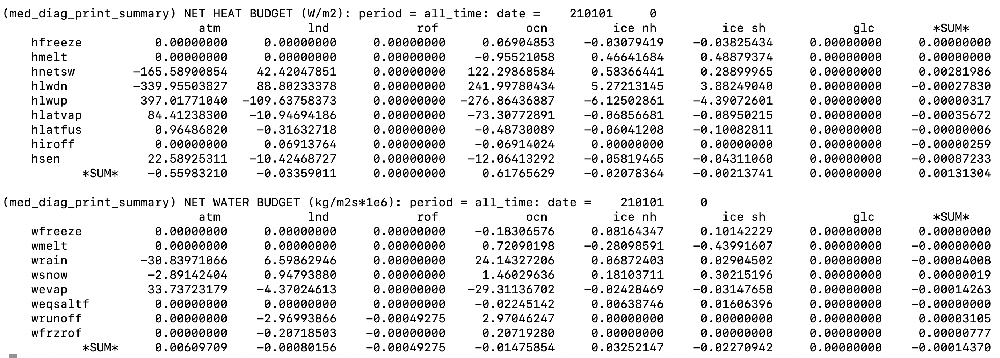

In [24]:
exp = 'bmom.e23.f09_t061_zstar_N65.nuopc.nuopc_validation.004'
nuopc_frc = xr.open_mfdataset(path+exp+'/run/'+exp+'.mom6.frc_????.nc').mean(dim='time')

In [25]:
Heat_PmE = np.ma.masked_invalid(nuopc_frc.Heat_PmE.values)
net_heat_surface = np.ma.masked_invalid(nuopc_frc.net_heat_surface.values)
net_heat_coupler = np.ma.masked_invalid(nuopc_frc.net_heat_coupler.values)
heat_content_surfwater = np.ma.masked_invalid(nuopc_frc.heat_content_surfwater.values)

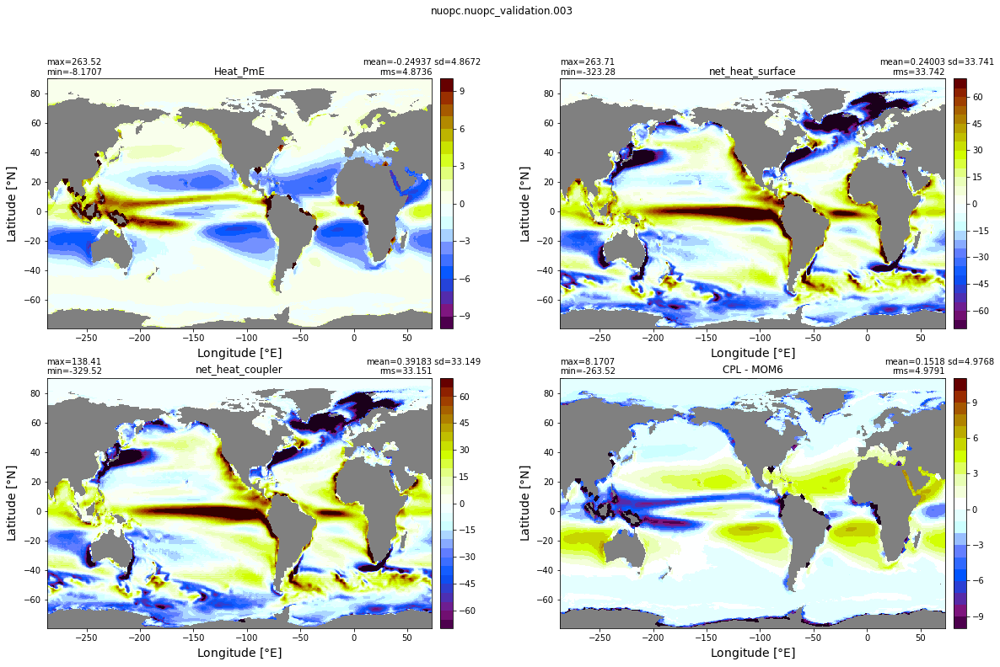

In [26]:
fig, ax = plt.subplots(nrows=2, ncols=2, figsize=(20,12))
ax1 = ax.flatten()
plt.suptitle('nuopc.nuopc_validation.003')

xyplot(Heat_PmE,grd.geolon, grd.geolat, grd.area_t, axis=ax1[0], title='Heat_PmE')
xyplot(net_heat_surface,grd.geolon, grd.geolat, grd.area_t, axis=ax1[1], title='net_heat_surface')
xyplot(net_heat_coupler,grd.geolon, grd.geolat, grd.area_t, axis=ax1[2], title='net_heat_coupler')
xyplot(net_heat_coupler - net_heat_surface,grd.geolon, grd.geolat, grd.area_t, axis=ax1[3], title='CPL - MOM6')

### nuopc.nuopc_validation.006

In [27]:
# bmom.e23.f09_t061_zstar_N65.nuopc.nuopc_validation.006
hi = 1.9799490287319331E+25
hf = 1.9900502304131875E+25  
cpl = 0.78847854
heat = (hf-hi) / (area.sum() * 3600. * 24 * 365. * n)
print('Change in heat from MOM log is {} W/m2'.format(heat))
print('Change in heat from cpl log is {} W/m2'.format(cpl))
print(cpl-heat)

Change in heat from MOM log is 0.4451416847541498 W/m2
Change in heat from cpl log is 0.78847854 W/m2
0.34333685524585017


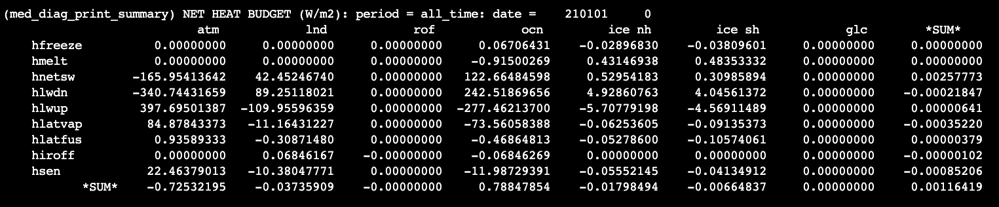

In [28]:
exp = 'bmom.e23.f09_t061_zstar_N65.nuopc.nuopc_validation.006'
nuopc_frc = xr.open_mfdataset(path+exp+'/run/'+exp+'.mom6.frc_????.nc').mean(dim='time')

In [29]:
Heat_PmE = np.ma.masked_invalid(nuopc_frc.Heat_PmE.values)
net_heat_surface = np.ma.masked_invalid(nuopc_frc.net_heat_surface.values)
net_heat_coupler = np.ma.masked_invalid(nuopc_frc.net_heat_coupler.values)
heat_content_surfwater = np.ma.masked_invalid(nuopc_frc.heat_content_surfwater.values)

In [30]:
frazil = np.ma.masked_invalid(nuopc_frc.frazil.values)
net_heat_coupler = net_heat_coupler - frazil

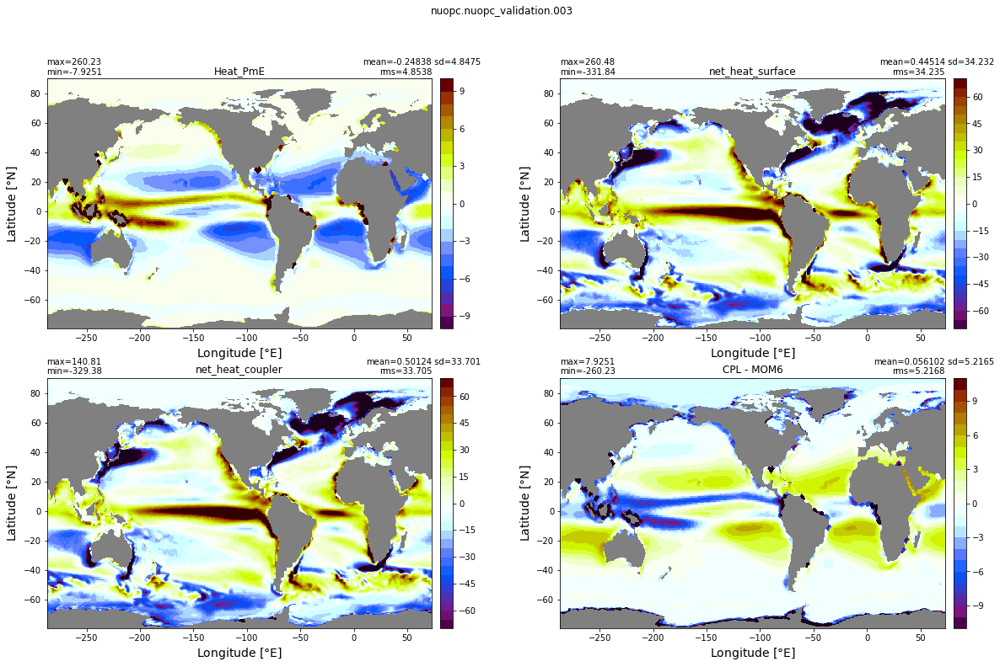

In [31]:
fig, ax = plt.subplots(nrows=2, ncols=2, figsize=(20,12))
ax1 = ax.flatten()
plt.suptitle('nuopc.nuopc_validation.003')

xyplot(Heat_PmE,grd.geolon, grd.geolat, grd.area_t, axis=ax1[0], title='Heat_PmE')
xyplot(net_heat_surface,grd.geolon, grd.geolat, grd.area_t, axis=ax1[1], title='net_heat_surface')
xyplot(net_heat_coupler,grd.geolon, grd.geolat, grd.area_t, axis=ax1[2], title='net_heat_coupler')
xyplot(net_heat_coupler - net_heat_surface,grd.geolon, grd.geolat, grd.area_t, axis=ax1[3], title='CPL - MOM6')

### nuopc.nuopc_short.001

In [62]:
# bmom.e23.f09_t061_zstar_N65.nuopc.nuopc_short.001
hi = 1.9799490287319331E+25
hf = 1.9788806627072517E+25  
cpl = -0.44453
n = 1 # years
heat = (hf-hi) / (area.sum() * 3600. * 24 * 365. * n)
print('Change in heat from MOM log is {} W/m2'.format(heat))
print('Change in heat from cpl log is {} W/m2'.format(cpl))
print(cpl-heat)

Change in heat from MOM log is -0.9416191601111028 W/m2
Change in heat from cpl log is -0.44453 W/m2
0.4970891601111028


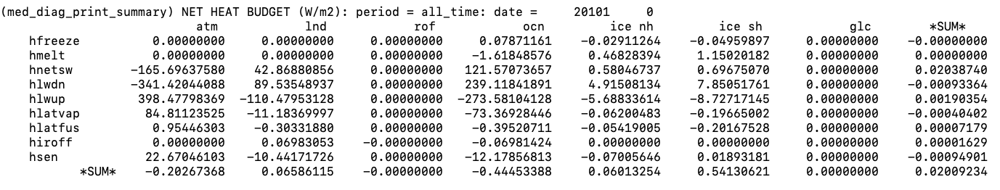

In [63]:
exp = 'bmom.e23.f09_t061_zstar_N65.nuopc.nuopc_short.001'
nuopc_frc = xr.open_dataset(path+exp+'/run/'+exp+'.mom6.frc_0001.nc').mean(dim='time')

In [90]:
#nuopc_frc

In [86]:
Heat_PmE = np.ma.masked_invalid(nuopc_frc.Heat_PmE.values)
net_heat_surface = np.ma.masked_invalid(nuopc_frc.net_heat_surface.values)
net_heat_coupler = np.ma.masked_invalid(nuopc_frc.net_heat_coupler.values)
heat_content_surfwater = np.ma.masked_invalid(nuopc_frc.heat_content_surfwater.values)
latent_evap = np.ma.masked_invalid(nuopc_frc.latent_evap.values)
latent_fprec_diag = np.ma.masked_invalid(nuopc_frc.latent_fprec_diag.values)
latent_frunoff = np.ma.masked_invalid(nuopc_frc.latent_frunoff.values)
frazil = np.ma.masked_invalid(nuopc_frc.frazil.values)
heat_content_icemelt = np.ma.masked_invalid(nuopc_frc.heat_content_icemelt.values)
SW = np.ma.masked_invalid(nuopc_frc.SW.values)
LW = np.ma.masked_invalid(nuopc_frc.LW.values)
sensible = np.ma.masked_invalid(nuopc_frc.sensible.values)
seaice_melt_heat = np.ma.masked_invalid(nuopc_frc.seaice_melt_heat.values)

In [87]:
net_heat_coupler = net_heat_coupler - frazil

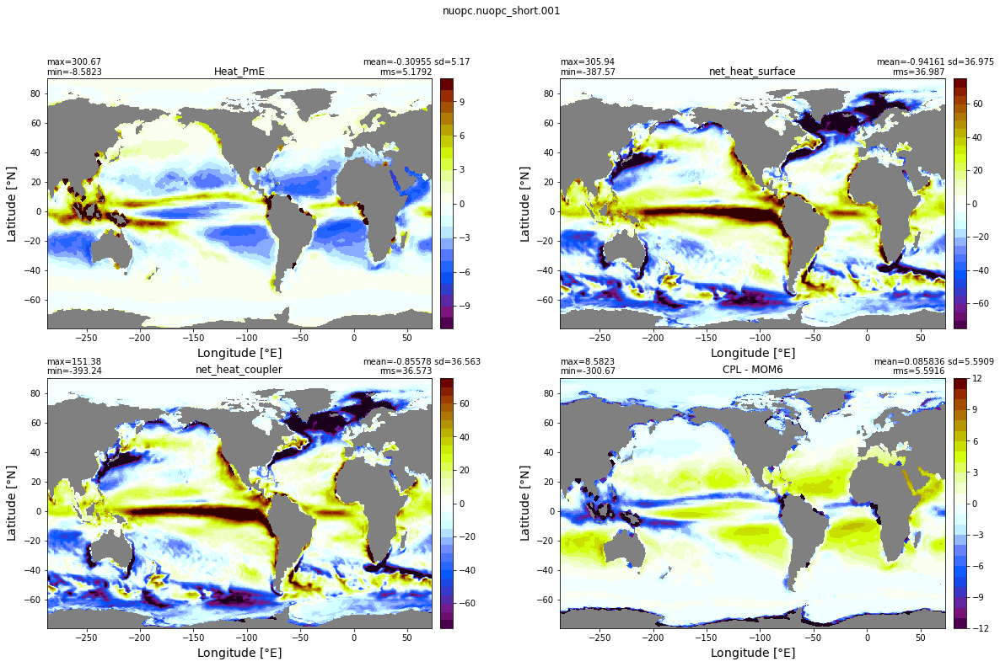

In [84]:
fig, ax = plt.subplots(nrows=2, ncols=2, figsize=(20,12))
ax1 = ax.flatten()
plt.suptitle('nuopc.nuopc_short.001')

xyplot(Heat_PmE,grd.geolon, grd.geolat, grd.area_t, axis=ax1[0], title='Heat_PmE')
xyplot(net_heat_surface,grd.geolon, grd.geolat, grd.area_t, axis=ax1[1], title='net_heat_surface')
xyplot(net_heat_coupler,grd.geolon, grd.geolat, grd.area_t, axis=ax1[2], title='net_heat_coupler')
xyplot(net_heat_coupler - net_heat_surface,grd.geolon, grd.geolat, grd.area_t, axis=ax1[3], title='CPL - MOM6')

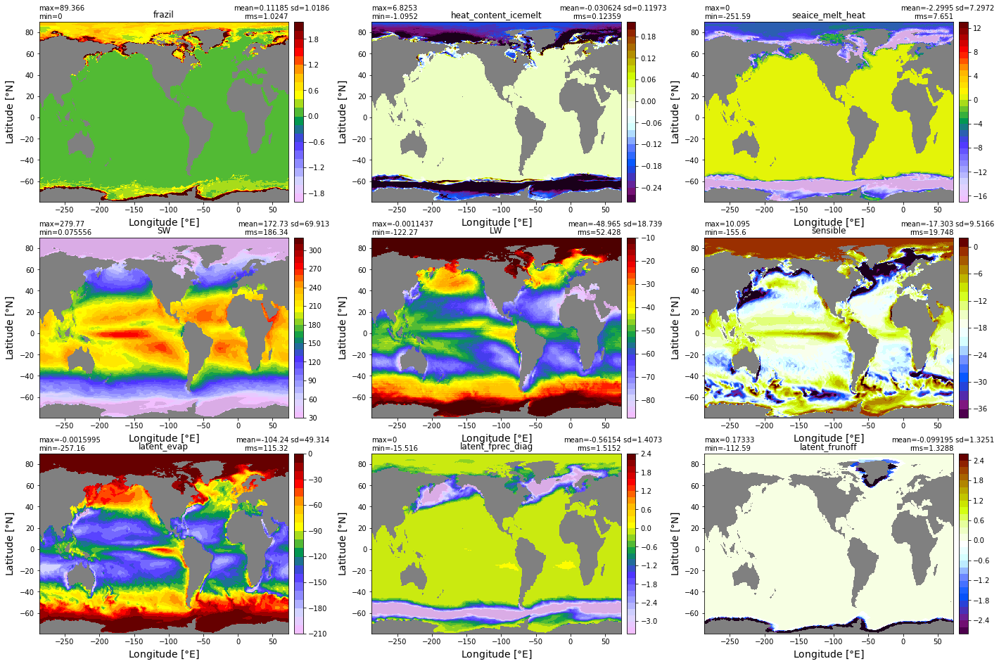

In [89]:
fig, ax = plt.subplots(nrows=3, ncols=3, figsize=(24,16))
ax1 = ax.flatten()
#plt.suptitle('nuopc.nuopc_short.001')

xyplot(frazil,grd.geolon, grd.geolat, grd.area_t, axis=ax1[0], title='frazil')
xyplot(heat_content_icemelt,grd.geolon, grd.geolat, grd.area_t, axis=ax1[1], title='heat_content_icemelt')
xyplot(seaice_melt_heat,grd.geolon, grd.geolat, grd.area_t, axis=ax1[2], title='seaice_melt_heat')

xyplot(SW,grd.geolon, grd.geolat, grd.area_t, axis=ax1[3], title='SW')
xyplot(LW,grd.geolon, grd.geolat, grd.area_t, axis=ax1[4], title='LW')
xyplot(sensible,grd.geolon, grd.geolat, grd.area_t, axis=ax1[5], title='sensible')

xyplot(latent_evap,grd.geolon, grd.geolat, grd.area_t, axis=ax1[6], title='latent_evap')
xyplot(latent_fprec_diag,grd.geolon, grd.geolat, grd.area_t, axis=ax1[7], title='latent_fprec_diag')
xyplot(latent_frunoff,grd.geolon, grd.geolat, grd.area_t, axis=ax1[8], title='latent_frunoff')

## Global means

## Globally-averaged ocean properties

../../bmom.e23.f09_t061_zstar_N65.nuopc.nuopc_validation.003/ncfiles/bmom.e23.f09_t061_zstar_N65.nuopc.nuopc_validation.003_mon_ave_global_means.nc
../../bmom.e23.f09_t061_zstar_N65.nuopc.nuopc_validation.004/ncfiles/bmom.e23.f09_t061_zstar_N65.nuopc.nuopc_validation.004_mon_ave_global_means.nc
../../bmom.e23.f09_t061_zstar_N65.nuopc.nuopc_validation.006/ncfiles/bmom.e23.f09_t061_zstar_N65.nuopc.nuopc_validation.006_mon_ave_global_means.nc
../../bmom.e23.f09_t061_zstar_N65.mct.nuopc_validation.003/ncfiles/bmom.e23.f09_t061_zstar_N65.mct.nuopc_validation.003_mon_ave_global_means.nc
../../bmom.e23.f09_t061_zstar_N65.mct.nuopc_validation.004/ncfiles/bmom.e23.f09_t061_zstar_N65.mct.nuopc_validation.004_mon_ave_global_means.nc


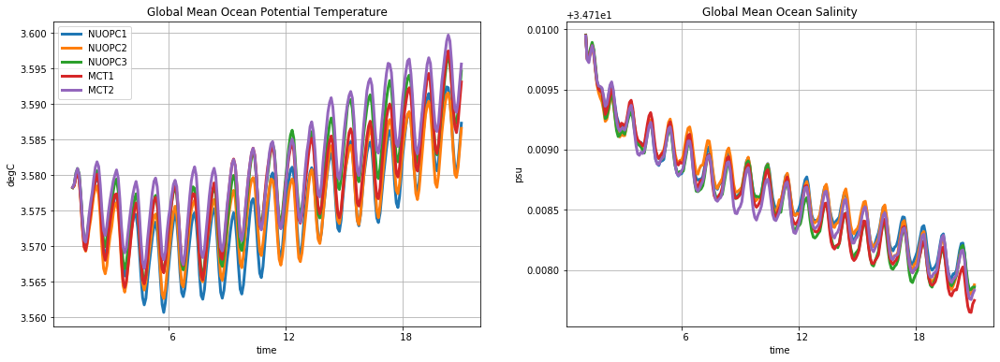

In [32]:
%matplotlib inline
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(18,6))
variables = ['thetaoga', 'soga']
for i in range(len(exps)):
  tmp = '../../'+exps[i]+'/ncfiles/'+exps[i]+'_mon_ave_global_means.nc'
  print(tmp)
  ds = get_data(tmp,variables)
  ds['thetaoga'].plot(ax=ax[0], label=labels[i], lw=3)
  ds['soga'].plot(ax=ax[1], lw=3)

ax[0].set_title(ds.thetaoga.attrs['long_name']); ax[0].set_ylabel(ds.thetaoga.attrs['units'])
ax[1].set_title(ds.soga.attrs['long_name']); ax[1].set_ylabel(ds.soga.attrs['units'])
ax[0].legend()
ax[0].grid(); ax[1].grid()
if saveplot:
    fname = 'PNG/global_means.png'
    plt.savefig(fname, bbox_inches='tight',dpi=300)

../../bmom.e23.f09_t061_zstar_N65.nuopc.nuopc_validation.003/ncfiles/bmom.e23.f09_t061_zstar_N65.nuopc.nuopc_validation.003_mon_ave_global_means.nc
../../bmom.e23.f09_t061_zstar_N65.nuopc.nuopc_validation.004/ncfiles/bmom.e23.f09_t061_zstar_N65.nuopc.nuopc_validation.004_mon_ave_global_means.nc
../../bmom.e23.f09_t061_zstar_N65.nuopc.nuopc_validation.006/ncfiles/bmom.e23.f09_t061_zstar_N65.nuopc.nuopc_validation.006_mon_ave_global_means.nc
../../bmom.e23.f09_t061_zstar_N65.mct.nuopc_validation.003/ncfiles/bmom.e23.f09_t061_zstar_N65.mct.nuopc_validation.003_mon_ave_global_means.nc
../../bmom.e23.f09_t061_zstar_N65.mct.nuopc_validation.004/ncfiles/bmom.e23.f09_t061_zstar_N65.mct.nuopc_validation.004_mon_ave_global_means.nc


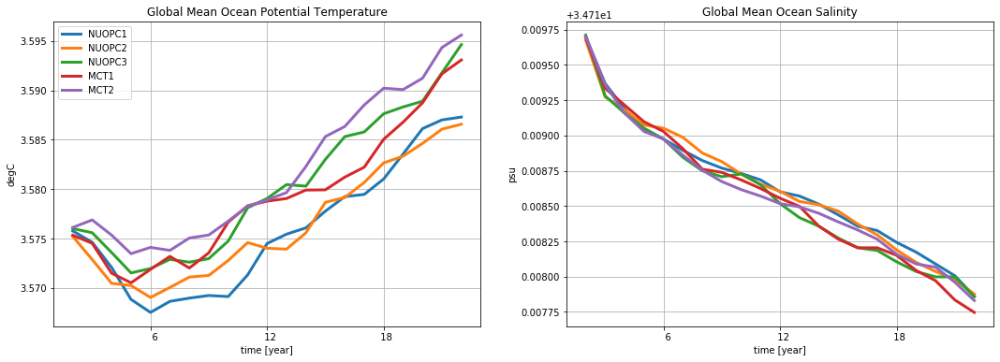

In [33]:
%matplotlib inline
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(18,6))
variables = ['thetaoga', 'soga']
for i in range(len(exps)):
  tmp = '../../'+exps[i]+'/ncfiles/'+exps[i]+'_mon_ave_global_means.nc'
  print(tmp)
  ds = get_data(tmp,variables)
  ds1 = ds.resample(time="1Y", closed='left').mean('time')
  ds1['thetaoga'].plot(ax=ax[0], label=labels[i], lw=3)
  ds1['soga'].plot(ax=ax[1], lw=3)

ax[0].set_title(ds.thetaoga.attrs['long_name']); ax[0].set_ylabel(ds.thetaoga.attrs['units'])
ax[1].set_title(ds.soga.attrs['long_name']); ax[1].set_ylabel(ds.soga.attrs['units'])
ax[0].set_xlabel('time [year]')
ax[1].set_xlabel('time [year]')

ax[0].legend()
ax[0].grid(); ax[1].grid()
if saveplot:
    fname = 'PNG/global_means.png'
    plt.savefig(fname, bbox_inches='tight',dpi=300)

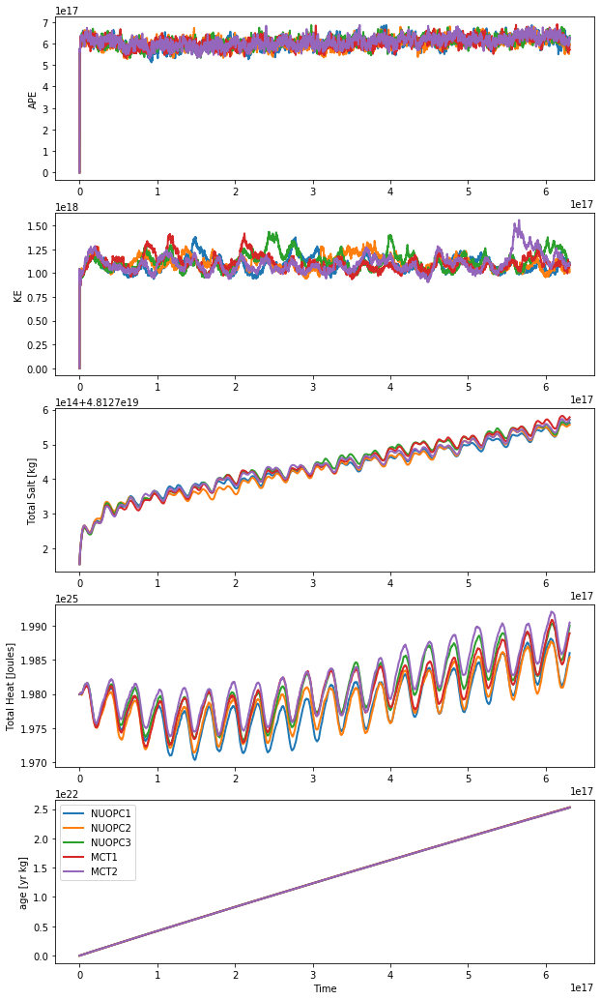

In [34]:
%matplotlib inline
variables = ['APE', 'KE', 'Salt', 'Heat', 'age']
fig, ax = plt.subplots(nrows=len(variables), ncols=1, figsize=(10,18))
for i in range(len(exps)): 
  ds = xr.open_dataset(path+exps[i]+'/run/ocean.stats.nc')
  #ds = ds.isel(Time=range(1000, 21172))
  for var, j in zip(variables, range(len(variables))):
    if len(ds[var].shape) > 1:
        tmp = ds[var].sum(axis=1)
    else:
        tmp = ds[var]
    tmp.plot(ax=ax[j], label=labels[i], lw=2)
    ax[j].set_xlabel('')
    
ax[j].set_xlabel('Time'); ax[j].legend()
if saveplot:
    fname = 'PNG/ocean_stats.png'
    plt.savefig(fname, bbox_inches='tight',dpi=300)

## Entalphy contribution

We will now focus on the most recent simulations with MCT and NUOPC, namely:
* bmom.e23.f09_t061_zstar_N65.mct.nuopc_validation.004
* bmom.e23.f09_t061_zstar_N65.nuopc.nuopc_validation.006


MCT imbalance:

```
Change in heat from MOM log is 0.46388148932143713 W/m2
Change in heat from cpl log is 0.50001278 W/m2
Difference = 0.03613129067856291 W/m2
```

```
Change in heat from MOM log is 0.4451416847541498 W/m2
Change in heat from cpl log is 0.78847854 W/m2
Difference = 0.34333685524585017 W/m2
```

Presumably, the differences between MOM and cpl logs are from the enthalpy contributions, which are accounted for by the cpl.

### MCT

In [35]:
exp = 'bmom.e23.f09_t061_zstar_N65.mct.nuopc_validation.004'
mct_frc = xr.open_mfdataset(path+exp+'/run/'+exp+'.mom6.frc_????.nc').mean(dim='time')

In [36]:
#mct_frc

In [37]:
Heat_PmE_mct = np.ma.masked_invalid(mct_frc.Heat_PmE.values)
net_heat_surface_mct = np.ma.masked_invalid(mct_frc.net_heat_surface.values)
net_heat_coupler_mct = np.ma.masked_invalid(mct_frc.net_heat_coupler.values)
heat_content_surfwater_mct = np.ma.masked_invalid(mct_frc.heat_content_surfwater.values)
frazil_mct = np.ma.masked_invalid(mct_frc.frazil.values)
LwLatSens_mct = np.ma.masked_invalid(mct_frc.LwLatSens.values)
SW_mct = np.ma.masked_invalid(mct_frc.SW.values)
sen_mct = np.ma.masked_invalid(mct_frc.sensible.values)
heat_content_lprec_mct = np.ma.masked_invalid(mct_frc.heat_content_lprec.values)
heat_content_fprec_mct = np.ma.masked_invalid(mct_frc.heat_content_fprec.values)
heat_content_icemelt_mct = np.ma.masked_invalid(mct_frc.heat_content_icemelt.values)
heat_content_frunoff_mct = np.ma.masked_invalid(mct_frc.heat_content_frunoff.values)
heat_content_cond_mct = np.ma.masked_invalid(mct_frc.heat_content_cond.values)
heat_content_massout_mct = np.ma.masked_invalid(mct_frc.heat_content_massout.values)
heat_content_lrunoff_mct = np.ma.masked_invalid(mct_frc.heat_content_lrunoff.values)
comp_sum_mct = ( heat_content_lprec_mct + heat_content_fprec_mct  + heat_content_icemelt_mct
           + heat_content_frunoff_mct + heat_content_cond_mct + heat_content_massout_mct 
           + heat_content_lrunoff_mct)


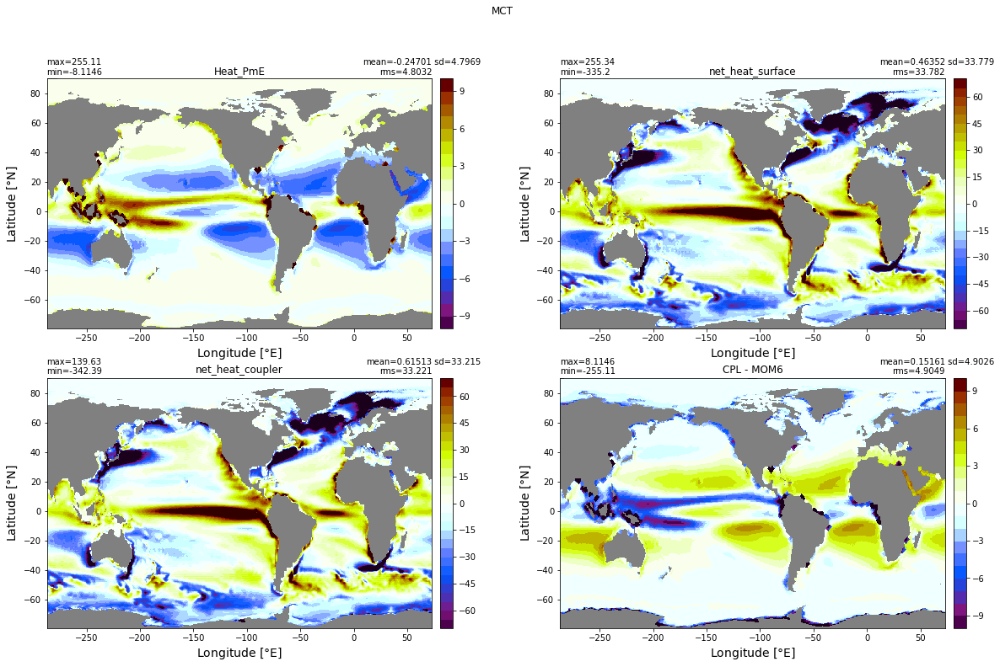

In [38]:
fig, ax = plt.subplots(nrows=2, ncols=2, figsize=(20,12))
ax1 = ax.flatten()
plt.suptitle('MCT')

xyplot(Heat_PmE_mct,grd.geolon, grd.geolat, grd.area_t, axis=ax1[0], title='Heat_PmE')
xyplot(net_heat_surface_mct,grd.geolon, grd.geolat, grd.area_t, axis=ax1[1], title='net_heat_surface')
xyplot(net_heat_coupler_mct,grd.geolon, grd.geolat, grd.area_t, axis=ax1[2], title='net_heat_coupler')
xyplot(net_heat_coupler_mct - net_heat_surface_mct,grd.geolon, grd.geolat, grd.area_t, axis=ax1[3], title='CPL - MOM6')

### NUOPC

In [39]:
exp = 'bmom.e23.f09_t061_zstar_N65.nuopc.nuopc_validation.006'
nuopc_frc = xr.open_mfdataset(path+exp+'/run/'+exp+'.mom6.frc_????.nc').mean(dim='time')

In [40]:
Heat_PmE_nuopc = np.ma.masked_invalid(nuopc_frc.Heat_PmE.values)
net_heat_surface_nuopc = np.ma.masked_invalid(nuopc_frc.net_heat_surface.values)
net_heat_coupler_nuopc = np.ma.masked_invalid(nuopc_frc.net_heat_coupler.values)
heat_content_surfwater_nuopc = np.ma.masked_invalid(nuopc_frc.heat_content_surfwater.values)
LwLatSens_nuopc = np.ma.masked_invalid(nuopc_frc.LwLatSens.values)
SW_nuopc = np.ma.masked_invalid(nuopc_frc.SW.values)
frazil_nuopc = np.ma.masked_invalid(nuopc_frc.frazil.values)
sen_nuopc = np.ma.masked_invalid(nuopc_frc.sensible.values)
heat_content_lprec_nuopc = np.ma.masked_invalid(nuopc_frc.heat_content_lprec.values)
heat_content_fprec_nuopc = np.ma.masked_invalid(nuopc_frc.heat_content_fprec.values)
heat_content_icemelt_nuopc = np.ma.masked_invalid(nuopc_frc.heat_content_icemelt.values)
heat_content_frunoff_nuopc = np.ma.masked_invalid(nuopc_frc.heat_content_frunoff.values)
heat_content_cond_nuopc = np.ma.masked_invalid(nuopc_frc.heat_content_cond.values)
heat_content_massout_nuopc = np.ma.masked_invalid(nuopc_frc.heat_content_massout.values)
heat_content_lrunoff_nuopc = np.ma.masked_invalid(nuopc_frc.heat_content_lrunoff.values)
comp_sum_nuopc = ( heat_content_lprec_nuopc + heat_content_fprec_nuopc  + heat_content_icemelt_nuopc
           + heat_content_frunoff_nuopc + heat_content_cond_nuopc + heat_content_massout_nuopc 
           + heat_content_lrunoff_nuopc)

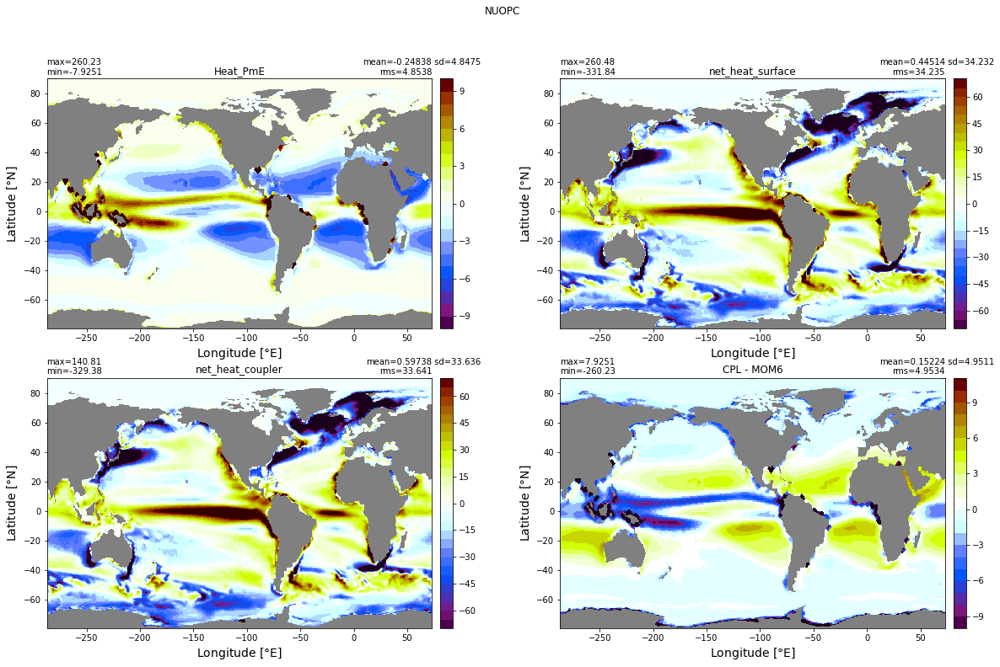

In [41]:
fig, ax = plt.subplots(nrows=2, ncols=2, figsize=(20,12))
ax1 = ax.flatten()
plt.suptitle('NUOPC')

xyplot(Heat_PmE_nuopc,grd.geolon, grd.geolat, grd.area_t, axis=ax1[0], title='Heat_PmE')
xyplot(net_heat_surface_nuopc,grd.geolon, grd.geolat, grd.area_t, axis=ax1[1], title='net_heat_surface')
xyplot(net_heat_coupler_nuopc,grd.geolon, grd.geolat, grd.area_t, axis=ax1[2], title='net_heat_coupler')
xyplot(net_heat_coupler_nuopc - net_heat_surface_nuopc,grd.geolon, grd.geolat, grd.area_t, axis=ax1[3], title='CPL - MOM6')

### Comparisons (MCT vs NUOPC)

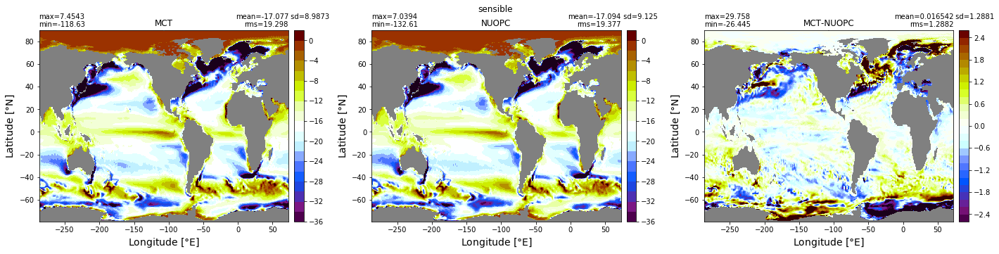

In [42]:
fig, ax = plt.subplots(nrows=1, ncols=3, figsize=(24,5.))
ax1 = ax.flatten()
plt.suptitle('sensible')

xyplot(sen_mct,grd.geolon, grd.geolat, grd.area_t, axis=ax1[0], title='MCT')
xyplot(sen_nuopc,grd.geolon, grd.geolat, grd.area_t, axis=ax1[1], title='NUOPC')
xyplot(sen_mct - sen_nuopc,grd.geolon, grd.geolat, grd.area_t, axis=ax1[2], 
       title='MCT-NUOPC')

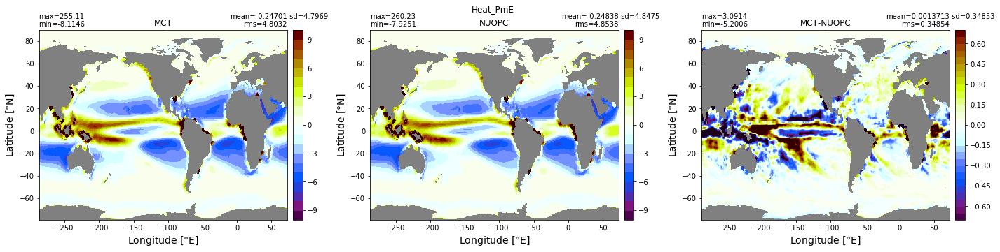

In [43]:
fig, ax = plt.subplots(nrows=1, ncols=3, figsize=(24,5.))
ax1 = ax.flatten()
plt.suptitle('Heat_PmE')

xyplot(Heat_PmE_mct,grd.geolon, grd.geolat, grd.area_t, axis=ax1[0], title='MCT')
xyplot(Heat_PmE_nuopc,grd.geolon, grd.geolat, grd.area_t, axis=ax1[1], title='NUOPC')
xyplot(Heat_PmE_mct - Heat_PmE_nuopc,grd.geolon, grd.geolat, grd.area_t, axis=ax1[2], title='MCT-NUOPC')

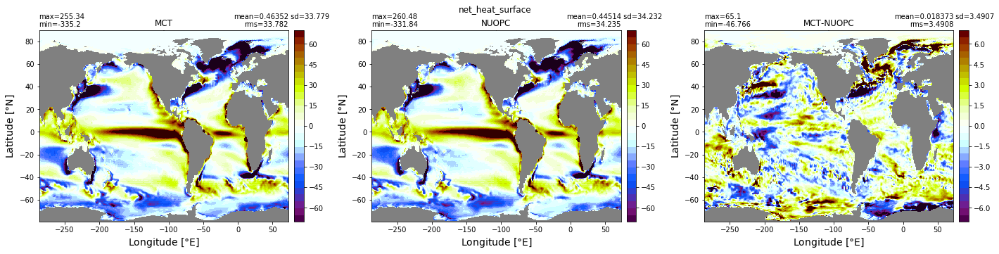

In [44]:
fig, ax = plt.subplots(nrows=1, ncols=3, figsize=(24,5.))
ax1 = ax.flatten()
plt.suptitle('net_heat_surface')

xyplot(net_heat_surface_mct,grd.geolon, grd.geolat, grd.area_t, axis=ax1[0], title='MCT')
xyplot(net_heat_surface_nuopc,grd.geolon, grd.geolat, grd.area_t, axis=ax1[1], title='NUOPC')
xyplot(net_heat_surface_mct - net_heat_surface_nuopc,grd.geolon, grd.geolat, grd.area_t, axis=ax1[2], title='MCT-NUOPC')

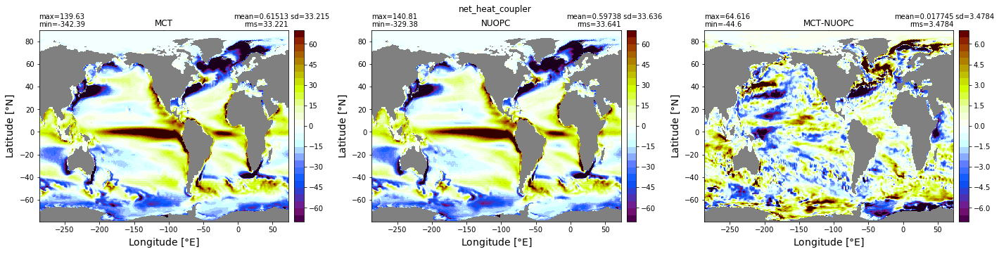

In [45]:
fig, ax = plt.subplots(nrows=1, ncols=3, figsize=(24,5.))
ax1 = ax.flatten()
plt.suptitle('net_heat_coupler')

xyplot(net_heat_coupler_mct,grd.geolon, grd.geolat, grd.area_t, axis=ax1[0], title='MCT')
xyplot(net_heat_coupler_nuopc,grd.geolon, grd.geolat, grd.area_t, axis=ax1[1], title='NUOPC')
xyplot(net_heat_coupler_mct - net_heat_coupler_nuopc,grd.geolon, grd.geolat, grd.area_t, axis=ax1[2], title='MCT-NUOPC')

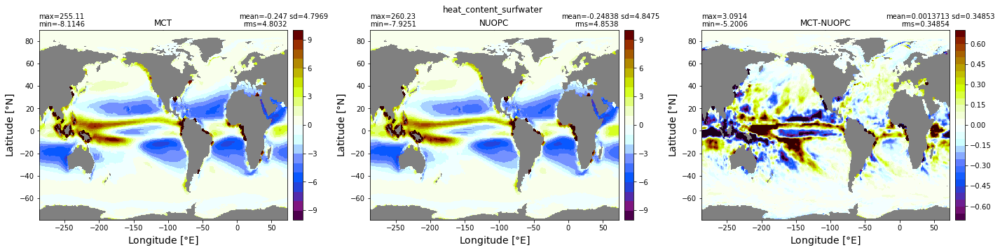

In [46]:
fig, ax = plt.subplots(nrows=1, ncols=3, figsize=(24,5.))
ax1 = ax.flatten()
plt.suptitle('heat_content_surfwater')

xyplot(heat_content_surfwater_mct,grd.geolon, grd.geolat, grd.area_t, axis=ax1[0], title='MCT')
xyplot(heat_content_surfwater_nuopc,grd.geolon, grd.geolat, grd.area_t, axis=ax1[1], title='NUOPC')
xyplot(heat_content_surfwater_mct - heat_content_surfwater_nuopc,grd.geolon, grd.geolat, grd.area_t, axis=ax1[2], title='MCT-NUOPC')

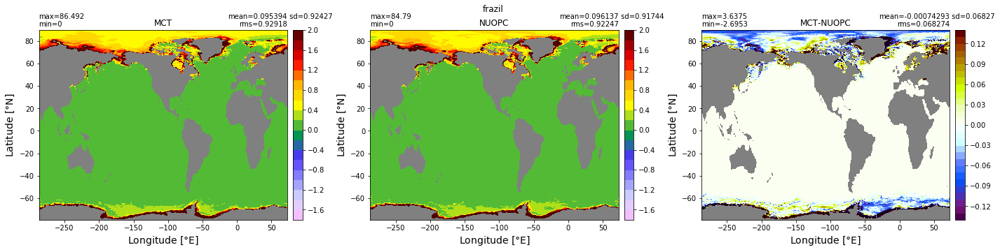

In [47]:
fig, ax = plt.subplots(nrows=1, ncols=3, figsize=(24,5.))
ax1 = ax.flatten()
plt.suptitle('frazil')

xyplot(frazil_mct,grd.geolon, grd.geolat, grd.area_t, axis=ax1[0], title='MCT')
xyplot(frazil_nuopc,grd.geolon, grd.geolat, grd.area_t, axis=ax1[1], title='NUOPC')
xyplot(frazil_mct - frazil_nuopc,grd.geolon, grd.geolat, grd.area_t, axis=ax1[2], title='MCT-NUOPC')

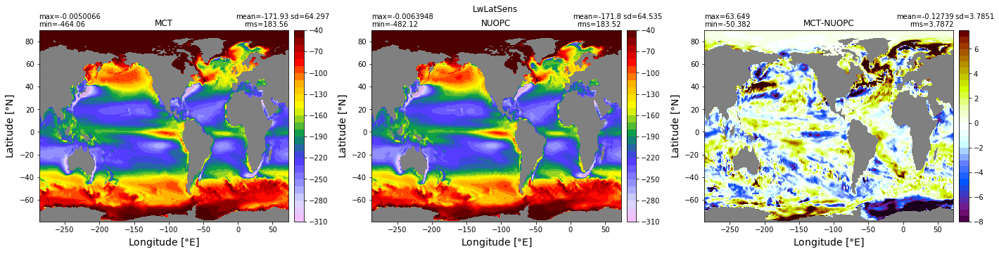

In [48]:
fig, ax = plt.subplots(nrows=1, ncols=3, figsize=(24,5.))
ax1 = ax.flatten()
plt.suptitle('LwLatSens')

xyplot(LwLatSens_mct,grd.geolon, grd.geolat, grd.area_t, axis=ax1[0], title='MCT')
xyplot(LwLatSens_nuopc,grd.geolon, grd.geolat, grd.area_t, axis=ax1[1], title='NUOPC')
xyplot(LwLatSens_mct - LwLatSens_nuopc,grd.geolon, grd.geolat, grd.area_t, axis=ax1[2], title='MCT-NUOPC')

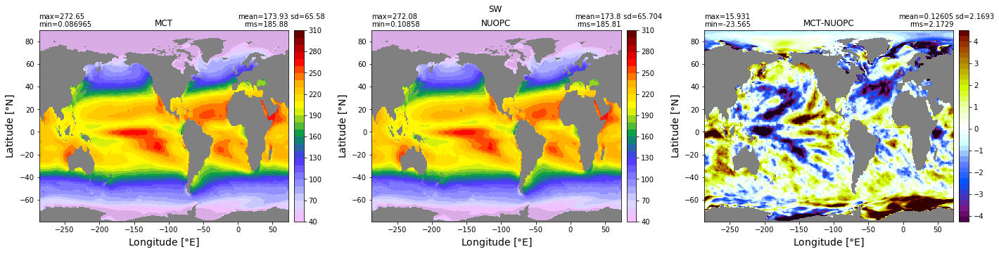

In [49]:
fig, ax = plt.subplots(nrows=1, ncols=3, figsize=(24,5.))
ax1 = ax.flatten()
plt.suptitle('SW')

xyplot(SW_mct,grd.geolon, grd.geolat, grd.area_t, axis=ax1[0], title='MCT')
xyplot(SW_nuopc,grd.geolon, grd.geolat, grd.area_t, axis=ax1[1], title='NUOPC')
xyplot(SW_mct - SW_nuopc,grd.geolon, grd.geolat, grd.area_t, axis=ax1[2], title='MCT-NUOPC')

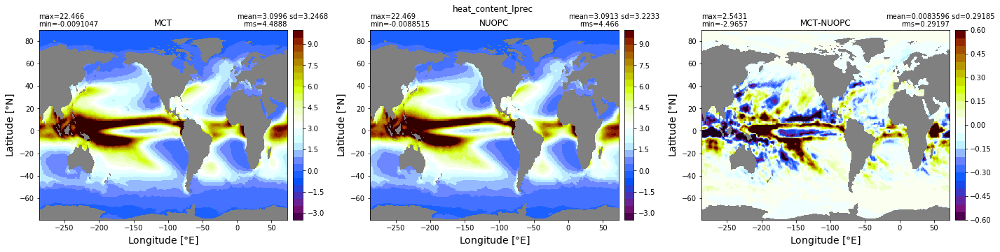

In [50]:
fig, ax = plt.subplots(nrows=1, ncols=3, figsize=(24,5.))
ax1 = ax.flatten()
plt.suptitle('heat_content_lprec')

xyplot(heat_content_lprec_mct,grd.geolon, grd.geolat, grd.area_t, axis=ax1[0], title='MCT')
xyplot(heat_content_lprec_nuopc,grd.geolon, grd.geolat, grd.area_t, axis=ax1[1], title='NUOPC')
xyplot(heat_content_lprec_mct - heat_content_lprec_nuopc,grd.geolon, grd.geolat, grd.area_t, axis=ax1[2], title='MCT-NUOPC')

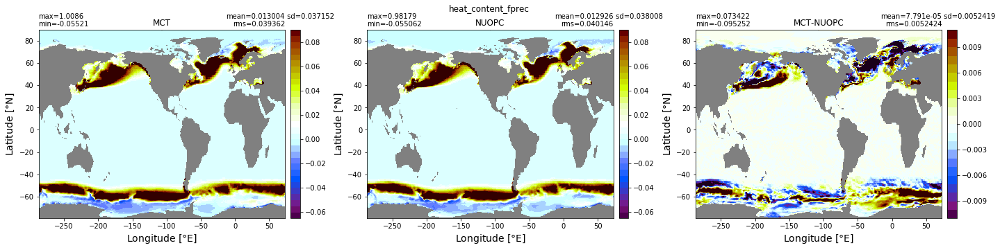

In [51]:
fig, ax = plt.subplots(nrows=1, ncols=3, figsize=(24,5.))
ax1 = ax.flatten()
plt.suptitle('heat_content_fprec')

xyplot(heat_content_fprec_mct,grd.geolon, grd.geolat, grd.area_t, axis=ax1[0], title='MCT')
xyplot(heat_content_fprec_nuopc,grd.geolon, grd.geolat, grd.area_t, axis=ax1[1], title='NUOPC')
xyplot(heat_content_fprec_mct - heat_content_fprec_nuopc,grd.geolon, grd.geolat, grd.area_t, axis=ax1[2], title='MCT-NUOPC')

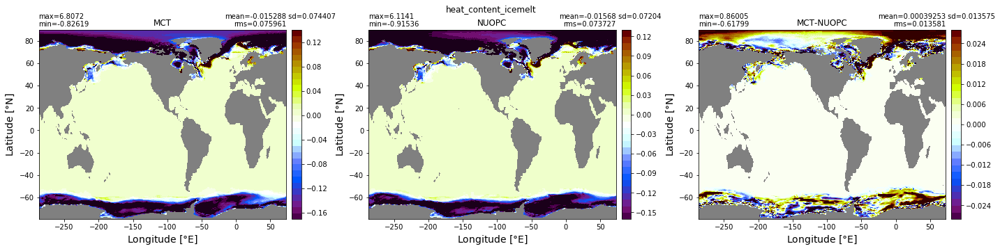

In [52]:
fig, ax = plt.subplots(nrows=1, ncols=3, figsize=(24,5.))
ax1 = ax.flatten()
plt.suptitle('heat_content_icemelt')

xyplot(heat_content_icemelt_mct,grd.geolon, grd.geolat, grd.area_t, axis=ax1[0], title='MCT')
xyplot(heat_content_icemelt_nuopc,grd.geolon, grd.geolat, grd.area_t, axis=ax1[1], title='NUOPC')
xyplot(heat_content_icemelt_mct - heat_content_icemelt_nuopc,grd.geolon, grd.geolat, grd.area_t, axis=ax1[2], 
       title='MCT-NUOPC')

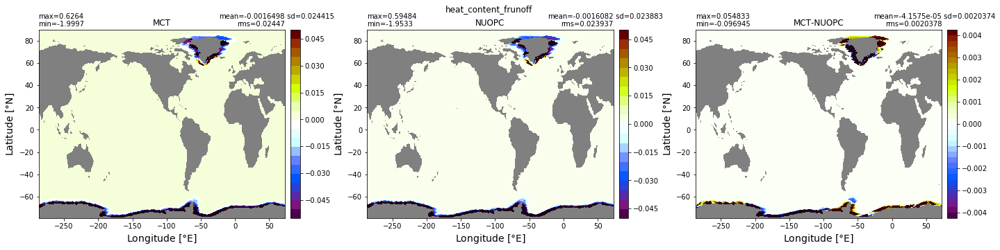

In [53]:
fig, ax = plt.subplots(nrows=1, ncols=3, figsize=(24,5.))
ax1 = ax.flatten()
plt.suptitle('heat_content_frunoff')

xyplot(heat_content_frunoff_mct,grd.geolon, grd.geolat, grd.area_t, axis=ax1[0], title='MCT')
xyplot(heat_content_frunoff_nuopc,grd.geolon, grd.geolat, grd.area_t, axis=ax1[1], title='NUOPC')
xyplot(heat_content_frunoff_mct - heat_content_frunoff_nuopc,grd.geolon, grd.geolat, grd.area_t, axis=ax1[2], 
       title='MCT-NUOPC')

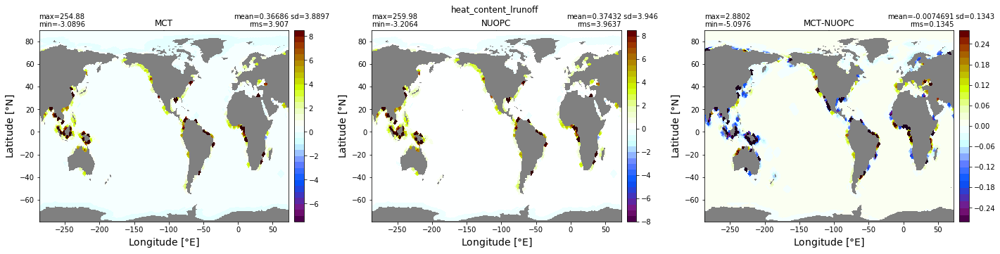

In [54]:
fig, ax = plt.subplots(nrows=1, ncols=3, figsize=(24,5.))
ax1 = ax.flatten()
plt.suptitle('heat_content_lrunoff')

xyplot(heat_content_lrunoff_mct,grd.geolon, grd.geolat, grd.area_t, axis=ax1[0], title='MCT')
xyplot(heat_content_lrunoff_nuopc,grd.geolon, grd.geolat, grd.area_t, axis=ax1[1], title='NUOPC')
xyplot(heat_content_lrunoff_mct - heat_content_lrunoff_nuopc,grd.geolon, grd.geolat, grd.area_t, axis=ax1[2], 
       title='MCT-NUOPC')

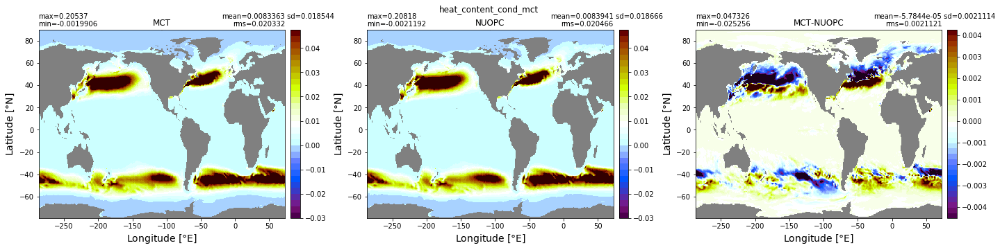

In [55]:
fig, ax = plt.subplots(nrows=1, ncols=3, figsize=(24,5.))
ax1 = ax.flatten()
plt.suptitle('heat_content_cond_mct')

xyplot(heat_content_cond_mct,grd.geolon, grd.geolat, grd.area_t, axis=ax1[0], title='MCT')
xyplot(heat_content_cond_nuopc,grd.geolon, grd.geolat, grd.area_t, axis=ax1[1], title='NUOPC')
xyplot(heat_content_cond_mct - heat_content_cond_nuopc,grd.geolon, grd.geolat, grd.area_t, axis=ax1[2], 
       title='MCT-NUOPC')

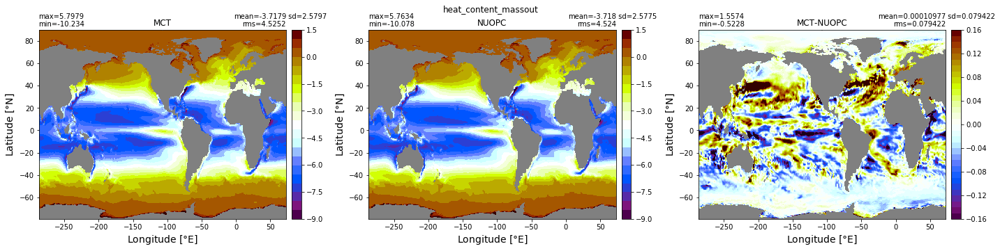

In [56]:
fig, ax = plt.subplots(nrows=1, ncols=3, figsize=(24,5.))
ax1 = ax.flatten()
plt.suptitle('heat_content_massout')

xyplot(heat_content_massout_mct,grd.geolon, grd.geolat, grd.area_t, axis=ax1[0], title='MCT')
xyplot(heat_content_massout_nuopc,grd.geolon, grd.geolat, grd.area_t, axis=ax1[1], title='NUOPC')
xyplot(heat_content_massout_mct - heat_content_massout_nuopc,grd.geolon, grd.geolat, grd.area_t, axis=ax1[2], 
       title='MCT-NUOPC')

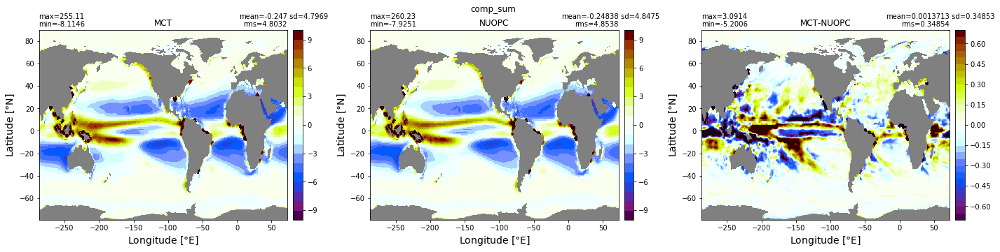

In [57]:
fig, ax = plt.subplots(nrows=1, ncols=3, figsize=(24,5.))
ax1 = ax.flatten()
plt.suptitle('comp_sum')

xyplot(comp_sum_mct,grd.geolon, grd.geolat, grd.area_t, axis=ax1[0], title='MCT')
xyplot(comp_sum_nuopc,grd.geolon, grd.geolat, grd.area_t, axis=ax1[1], title='NUOPC')
xyplot(comp_sum_mct - comp_sum_nuopc,grd.geolon, grd.geolat, grd.area_t, axis=ax1[2], 
       title='MCT-NUOPC')